In [1]:
library("Matrix")
library(Seurat)
library(DT)
library(dplyr)
library(here)
library(ggplot2)
library(mclust)
library(cowplot)
library(tidyverse)
library(reshape)
library(SingleR)
library(annotate)
library("org.Mm.eg.db")
library(biomaRt)
library(scCustomize)
library(future)
library(ggnewscale)
library(furrr)
library(readxl)
library(STACAS)

rank_score_func <- function(df){

df <- df %>% mutate(score = -1*log(p_val_adj+(10^-310))*avg_logFC*(pct.1/(pct.2+10^-300)))

return(df)
}

convertHumanGeneList <- function(x){

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

genesV2 = getLDS(attributes = c("hgnc_symbol"), filters = "hgnc_symbol", values = x , mart = human, attributesL = c("mgi_symbol"), martL = mouse, uniqueRows=T)

humanx <- unique(genesV2[, 2])

# Print the first 6 genes found to the screen
print(head(humanx))
return(humanx)
}

library("remotes")
library("fs")

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}

mid.se <- celldex::MonacoImmuneData();

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: 'DT'


The following object is masked from 'package:SeuratObject':

    JS


The following object is masked from 'package:Seurat':

    JS



Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


here() starts at /auto/brno2/home/vercanie/DIA

Package 'mclust' version 5.4.8
Type 'citation("mclust")' for citing this R package in publica

In [2]:
plan("multisession")

# All diabetes data - new and old

## CD4 new

In [3]:
paths  <- list.files("data/rawdata/", full.names = T)

In [4]:
paths

[1] "data/rawdata//exp08_init_with_Mixcr.rds"      
 [2] "data/rawdata//exp10_init_with_Mixcr.rds"      
 [3] "data/rawdata//exp11_W1_init_with_Mixcr.rds"   
 [4] "data/rawdata//exp11_W2_init_with_Mixcr.rds"   
 [5] "data/rawdata//exp16_CD4_A_init_with_Mixcr.rds"
 [6] "data/rawdata//exp16_CD4_B_init_with_Mixcr.rds"
 [7] "data/rawdata//exp16_CD8_A_init_with_Mixcr.rds"
 [8] "data/rawdata//exp16_CD8_B_init_with_Mixcr.rds"
 [9] "data/rawdata//exp18_1_init_with_Mixcr.rds"    
[10] "data/rawdata//exp18_2_init_with_Mixcr.rds"    
[11] "data/rawdata//exp18_3_init_with_Mixcr.rds"    
[12] "data/rawdata//exp18_4_init_with_Mixcr.rds"    
[13] "data/rawdata//exp19_1_init_with_Mixcr.rds"    
[14] "data/rawdata//exp19_2_init_with_Mixcr.rds"    
[15] "data/rawdata//exp19_3_init_with_Mixcr.rds"    
[16] "data/rawdata//exp19_4_init_with_Mixcr.rds"    
[17] "data/rawdata//exp20_1_init_with_Mixcr.rds"    
[18] "data/rawdata//exp20_2_init_with_Mixcr.rds"    
[19] "data/rawdata//exp20_3_init_with_Mixcr.rds"    
[20] "data/rawdata//exp20_4_init_with_Mixcr.rds"

In [5]:
seu_list  <- map(paths[c(2,4,5,6,10,12,14,16,18,20)], readRDS)

In [6]:
seu_list[[1]]$hashtags  %>% table

.
 H1 H10  H2  H3  H4  H5  H6  H7  H8  H9 
743 831 821 762 825 695 821 761 787 802 

In [7]:
exp10_cd4  <- subset(seu_list[[1]], hashtags != "H5")

In [8]:
seu_list[[1]] <- exp10_cd4

In [9]:
seu_list[[1]]$Condition  %>% table

.
Ctrl T0  Dia T0 
   2326    4827 

In [10]:
new_dia_cd4  <- scCustomize::Merge_Seurat_List(seu_list)

Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


In [11]:
new_dia_cd4

An object of class Seurat 
15427 features across 98852 samples within 3 assays 
Active assay: RNA (15413 features, 0 variable features)
 2 other assays present: Antibodies, PTPRC

In [12]:
options(future.globals.maxSize = 10000 * 1024^2)
plan("sequential")

In [13]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
17:51:12 UMAP embedding parameters a = 0.9922 b = 1.112

17:51:12 Read 98852 rows and found 12 numeric columns

17:51:12 Using Annoy for neighbor search, n_neighbors = 30

17:51:12 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:51:21 Writing NN index file to temp file /var/tmp/pbs.18192037.meta-pbs.metacentrum.cz/RtmpkadGwt/file2d25f248ce11d

17:51:21 Searching Annoy index using 1 thread, search_k = 3000

17:52:03 Annoy recall = 100%

17:52:04 Commencing smooth kNN distance calibratio

In [14]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 98852
Number of edges: 2595361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8283
Number of communities: 22
Elapsed time: 50 seconds


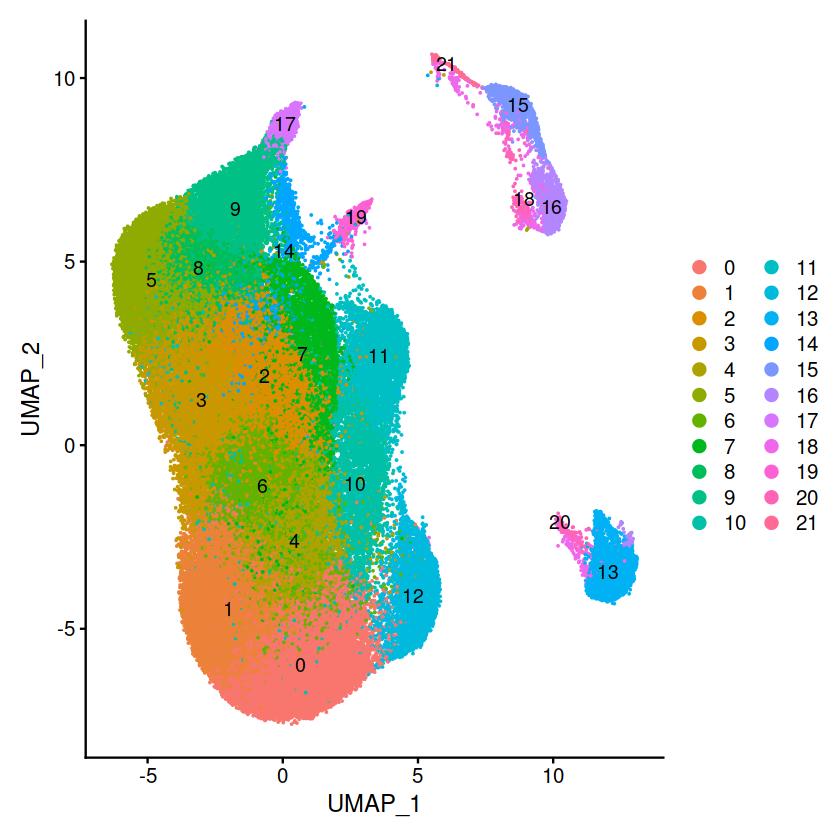

In [15]:
DimPlot(new_dia_cd4, label = T)

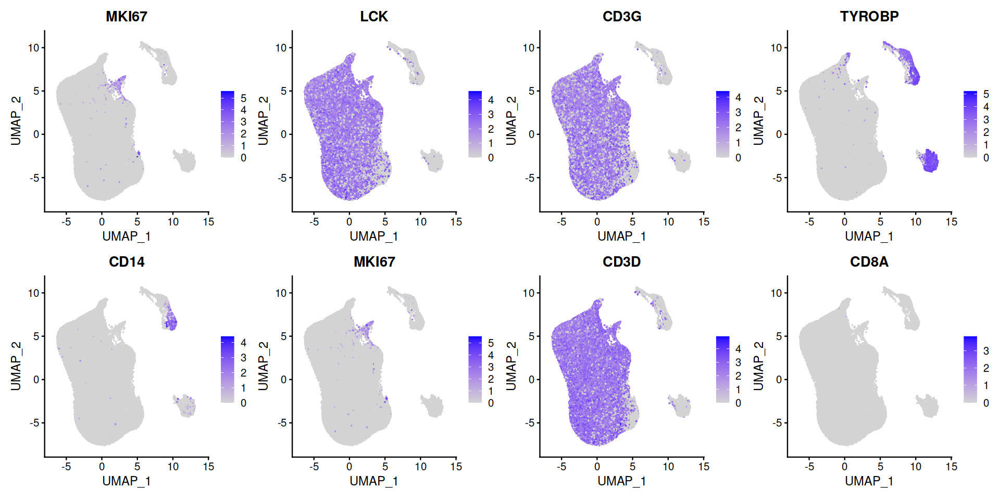

In [16]:
options(repr.plot.width = 16, repr.plot.height = 8)
FeaturePlot(new_dia_cd4, features = c("MKI67", "LCK", "CD3G", "TYROBP", "CD14", "MKI67", "CD3D", "CD8A"), ncol = 4)

### Automated annotation of cell types

In [17]:
library(Azimuth)
mid.se <- celldex::MonacoImmuneData()
hpca.se  <- celldex::HumanPrimaryCellAtlasData()
load("data/ref_wherry_new.RData")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Attaching shinyBS

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache



In [18]:
annotate_tcell_data  <- function(seurat_dataset){
    
    ## This function annotates a Seurat object with three annotations:
    ## 1. Monaco Immune dataset annotations
    ## 2. Annotations based on bulk RNAseq from Giles et al, 2022
    ## 3. Azimuth annotations
        
    DefaultAssay(seurat_dataset)  <- "RNA"
	
    ### Annotate the dataset with Monaco Immune dataset
		pred.singler <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = mid.se, assay.type.test=1,
		labels = mid.se$label.fine, fine.tune = F)
    
	### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = ref_wherry_new$matrix,
		labels = ref_wherry_new$labels, fine.tune = F)

    	### Annotate the dataset with Wherry dataset
        pred.singler3 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = hpca.se,
		assay.type.test=1,
		labels = hpca.se$label.fine, fine.tune = F)

		all_labels <- data.frame(
		Monaco_single = pred.singler$labels,
		HPCA_single = pred.singler3$labels,
		Wherry_main = pred.singler2$labels,
		barcode = colnames(seurat_dataset))
		
		md2 <- seurat_dataset@meta.data
		md2$barcode = colnames(seurat_dataset)

		md3 <- left_join(md2, all_labels)

		seurat_dataset@meta.data <- md3
		rownames(seurat_dataset@meta.data) <- colnames(seurat_dataset)
		
	### Annotate the dataset with Azimuth
		
		seurat_dataset <- RunAzimuth(seurat_dataset, reference = "pbmcref")
		return(seurat_dataset)
	}


new_dia_cd4  <- annotate_tcell_data(new_dia_cd4)

Joining with `by = join_by(barcode)`


An AzimuthData object - reference version: 1.0.0 
Contains 3 meta.data field(s) to transfer.

Warning message:
"Overwriting miscellanous data for model"
detected inputs from HUMAN with id type Gene.name

reference rownames detected HUMAN with id type Gene.name

Using reference SCTModel to calculate pearson residuals

Determine variable features

Setting min_variance to:  -Inf

Calculating residuals of type pearson for 3918 genes



  |======================================================================| 100%


Set default assay to refAssay

Normalizing query using reference SCT model

Projecting cell embeddings

Finding query neighbors

Finding neighborhoods

Finding anchors

	Found 9364 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to p

In [19]:
saveRDS(new_dia_cd4, "data/processed/cd4_full.rds")

In [ ]:
new_dia_cd4  <- readRDS("data/processed/cd4_full.rds")

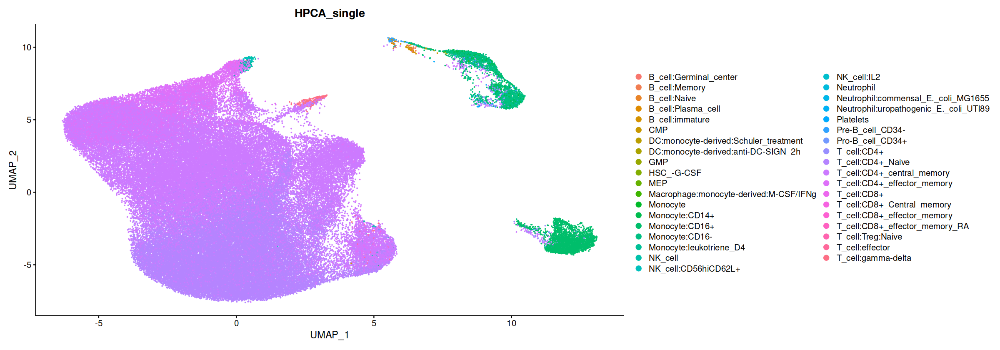

In [20]:
options(repr.plot.width = 20, repr.plot.height = 7)

DimPlot(new_dia_cd4, raster = F, group.by = "HPCA_single", label = F)

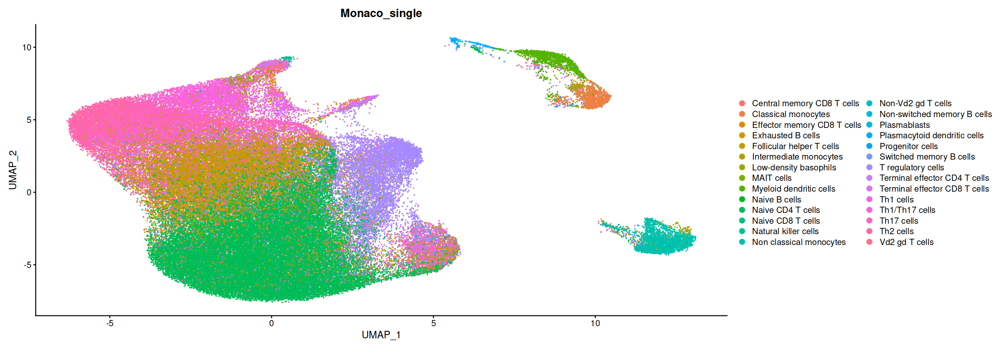

In [21]:
DimPlot(new_dia_cd4, raster = F, group.by = "Monaco_single", label = F)

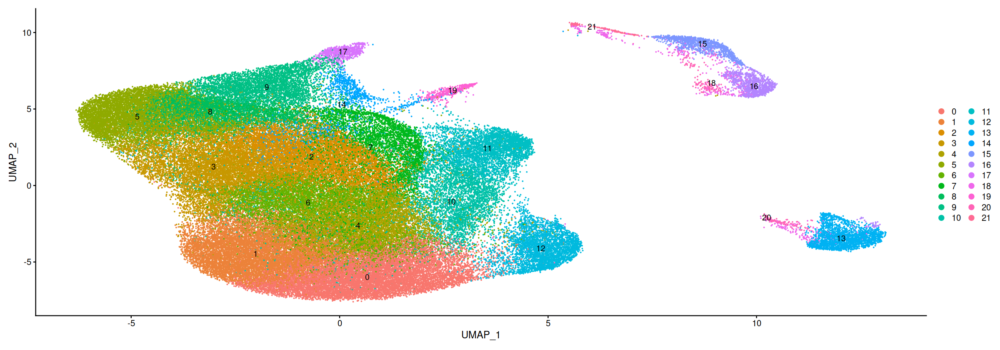

In [22]:
DimPlot(new_dia_cd4, label = T, raster = F)

### Remove contaminating cells

In [23]:
new_dia_cd4  <- subset(new_dia_cd4, seurat_clusters %in% c(0:12,14,17,19))

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from ref.umap_ to refumap_"


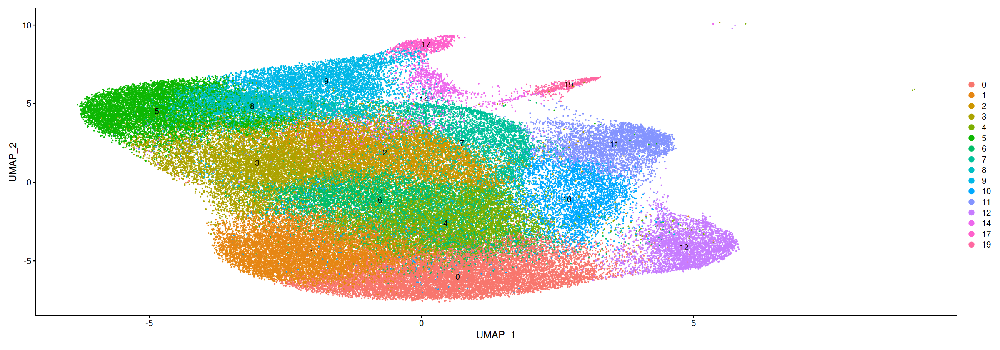

In [24]:
DimPlot(new_dia_cd4, label = T, raster = F)

In [25]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

18:31:55 UMAP embedding parameters a = 0.9922 b = 1.112

18:31:55 Read 92901 rows and found 12 numeric columns

18:31:55 Using Annoy for neighbor search, n_neighbors = 30

18:31:55 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:32:04 Writing NN index file to temp file /var/tmp/pbs.18192037.meta-pbs.metacentrum.cz/RtmpkadGwt/file2d25f4b6705d0

18:32:04 Searching Annoy index using 1 thread, search_k = 3000

18:32:44 Annoy recall = 100%

18:32:44 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

18:32:47 Initializing from normalized Laplacian + noise (using irlba)

18:32:49 Commencing optimization for 200 epochs, with 3935548 positive edges

18:33:20 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 92901
Number of edges: 2327149

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8146
Number of communities: 18
Elapsed time: 42 seconds


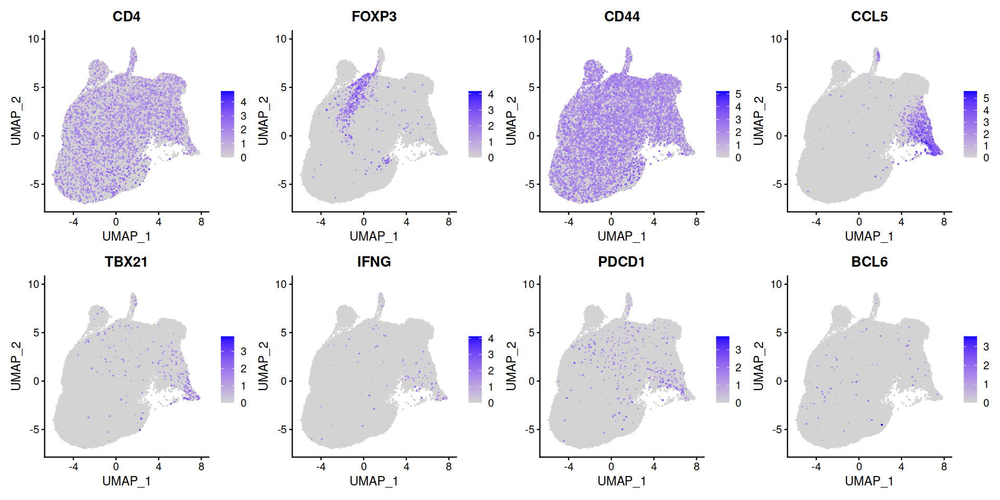

In [26]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "FOXP3", "CD44", "CCL5", "TBX21", "IFNG", "PDCD1", "BCL6"), ncol = 4)

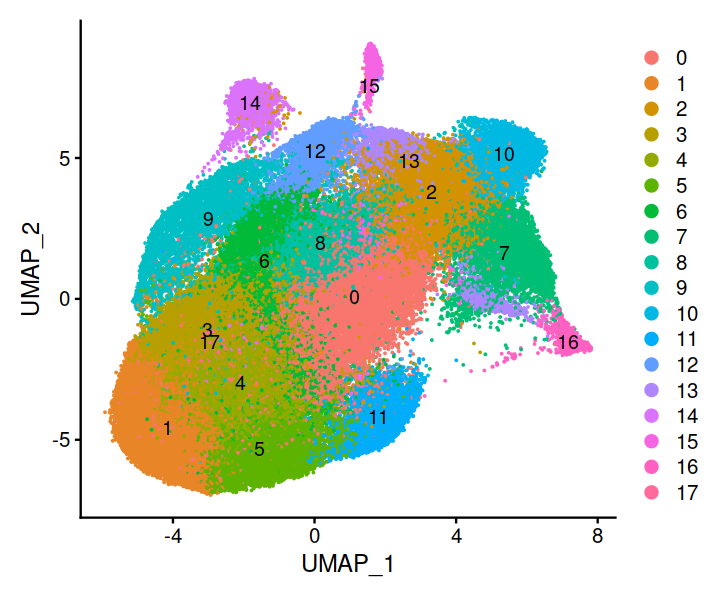

In [27]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

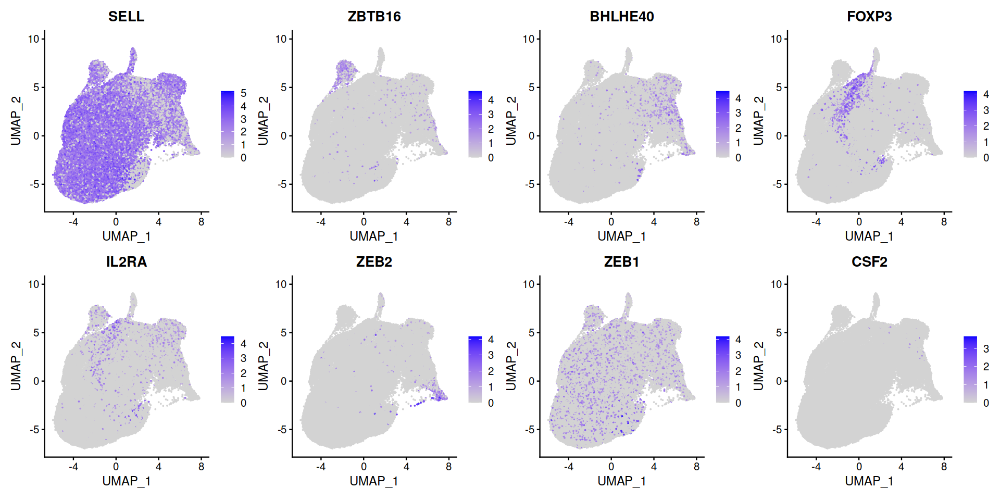

In [28]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("SELL", "ZBTB16", "BHLHE40", "FOXP3", "IL2RA", "ZEB2", "ZEB1", "CSF2"), ncol = 4)

In [29]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

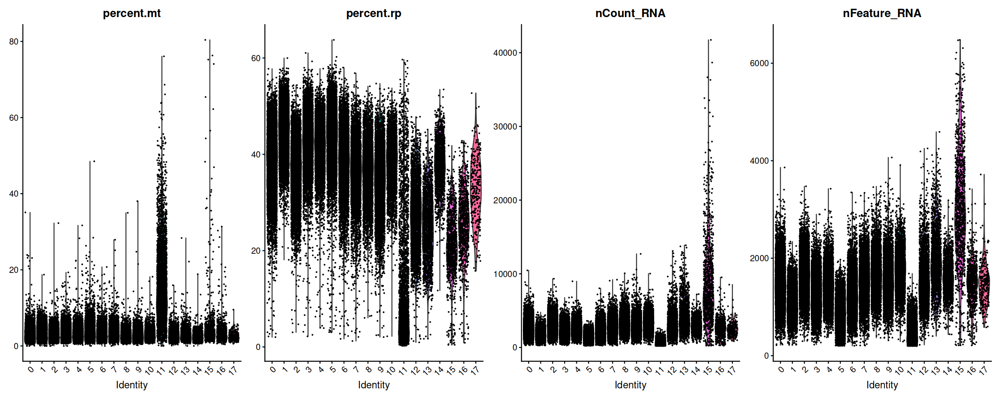

In [30]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

### Remove dead cells

In [31]:
cutoff_nFeature_RNA <- 500
cutoff_percent_mt <- 10
cluster_exclude <- c(11)

In [32]:
p1 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                  exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = percent_mt)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_percent_mt,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("Percent mt. cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=cutoff_percent_mt,ymax=1.1*(max(new_dia_cd4$percent.mt)), fill = "red", alpha = 0.1)

p2 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                        exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = nFeature_RNA)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_nFeature_RNA,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("nFeature RNA cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=0, ymax=cutoff_nFeature_RNA, fill = "red", alpha = 0.1)

Warning message in geom_hline(yintercept = cutoff_percent_mt, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"
Warning message in geom_hline(yintercept = cutoff_nFeature_RNA, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"


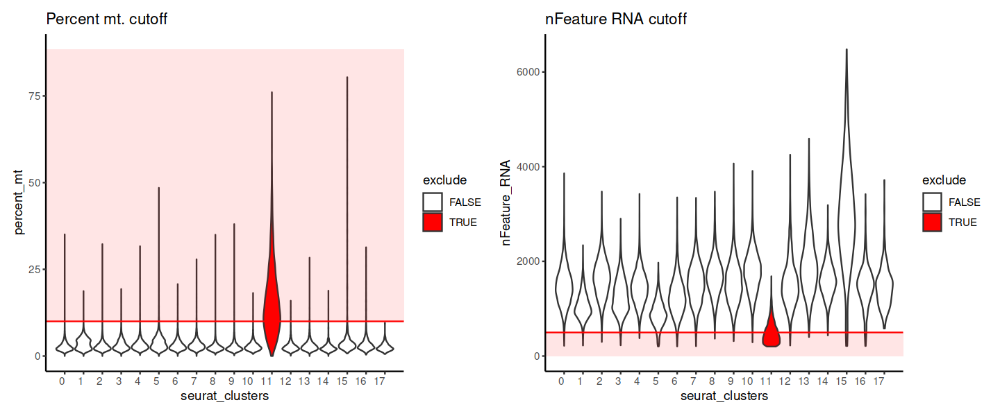

In [33]:
options(repr.plot.width = 12, repr.plot.height = 5)
p1 + p2

In [34]:
new_dia_cd4  <- subset(new_dia_cd4, 
                       seurat_clusters %in% c(0:10,12:17) &
                      percent.mt < cutoff_percent_mt &
                      nFeature_RNA > cutoff_nFeature_RNA)

In [35]:
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

18:35:42 UMAP embedding parameters a = 0.9922 b = 1.112

18:35:42 Read 87897 rows and found 12 numeric columns

18:35:42 Using Annoy for neighbor search, n_neighbors = 30

18:35:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:35:50 Writing NN index file to temp file /var/tmp/pbs.18192037.meta-pbs.metacentrum.cz/RtmpkadGwt/file2d25f7dc2bbcf

18:35:50 Searching Annoy index using 1 thread, search_k = 3000

18:36:28 Annoy recall = 100%

18:36:29 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

18:36:32 Initializing from normalized Laplacian + noise (using irlba)

18:36:34 Commencing optimization for 200 epochs, with 3680886 positive edges

18:37:03 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 87897
Number of edges: 2212212

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8111
Number of communities: 18
Elapsed time: 44 seconds


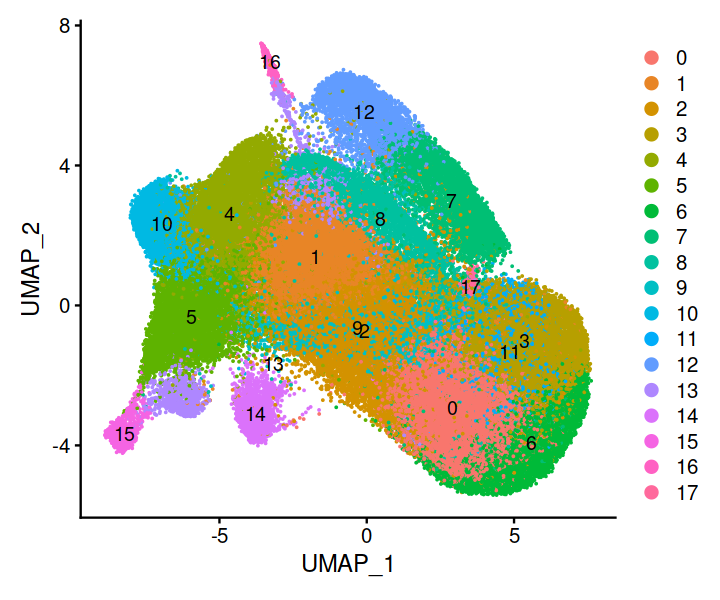

In [36]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

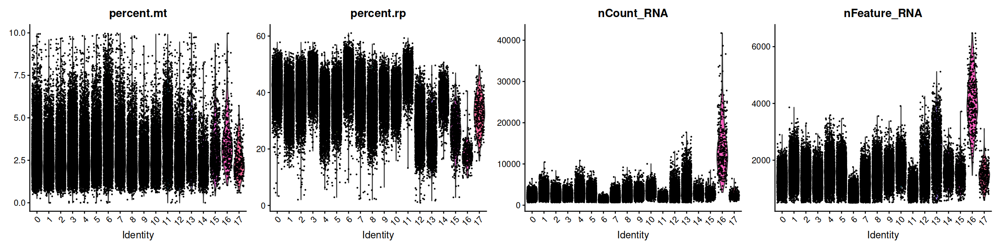

In [37]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

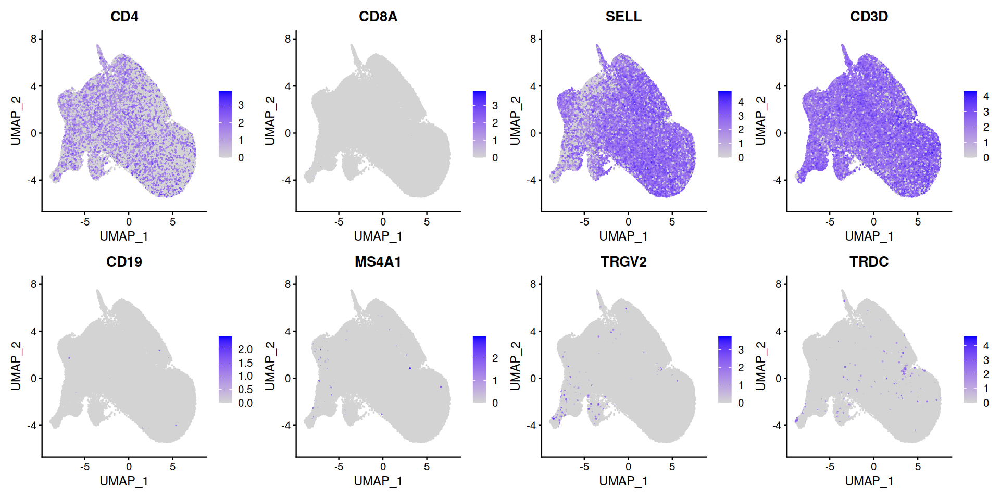

In [38]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "CD8A", "SELL", "CD3D", "CD19", "MS4A1", "TRGV2", "TRDC"), ncol = 4)

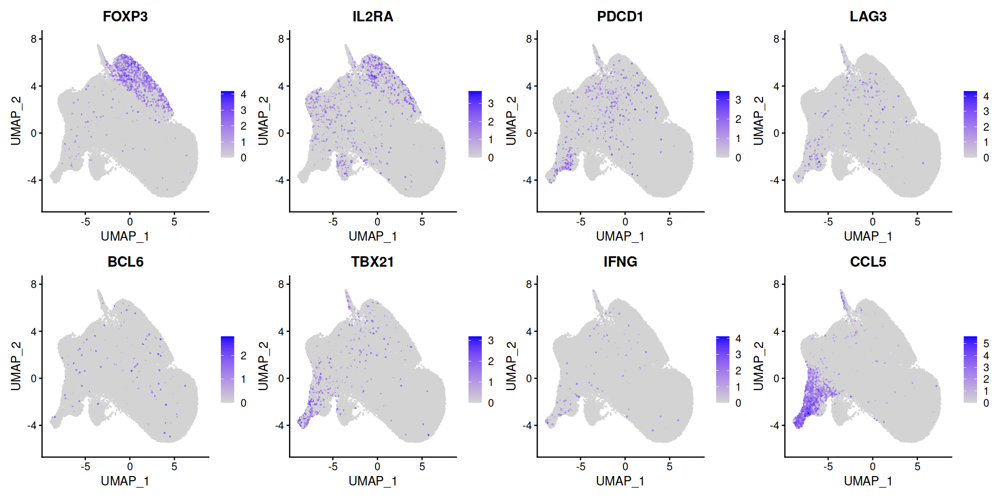

In [39]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("FOXP3", "IL2RA", "PDCD1", "LAG3", "BCL6", "TBX21", "IFNG", "CCL5"), ncol = 4)

Warning message:
"Could not find PTPRC-RA in the default search locations, found in PTPRC assay instead"
Warning message:
"Could not find PTPRC-RO in the default search locations, found in PTPRC assay instead"


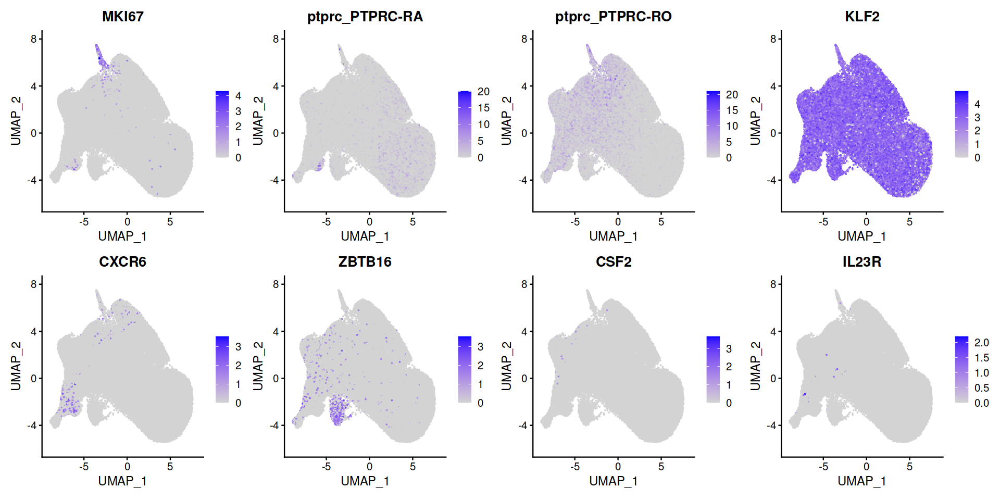

In [40]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("MKI67", "PTPRC-RA", "PTPRC-RO", "KLF2", "CXCR6", "ZBTB16", "CSF2", "IL23R"), ncol = 4)

In [41]:
new_dia_cd4@meta.data  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "percent.mt"                 
 [5] "percent.rp"                  "nCount_Antibodies"          
 [7] "nFeature_Antibodies"         "hashtags"                   
 [9] "Experiment_ID"               "Prepared_by"                
[11] "Sample_ID"                   "Well"                       
[13] "Hashtag"                     "Hashtag_sequence"           
[15] "Hashtag_cat_n"               "Hashtag_dilution"           
[17] "Project.code"                "Well_CT_ID"                 
[19] "Condition"                   "Disease"                    
[21] "Time"                        "Species"                    
[23] "Age"                         "Age_group"                  
[25] "Sex"                         "Library_code"               
[27] "Patient_ID"                  "is_cell"                    
[29] "chain"                       "contig_id"                  
[31] "high_confidence"             "productive"                 
[33] "length"                      "reads"                      
[35] "umis"                        "vdj_source"                 
[37] "count_TRA"                   "count_TRB"                  
[39] "count_Multi"                 "cdr3_A1"                    
[41] "cdr3_A1_nt"                  "cdr3_A2"                    
[43] "cdr3_A2_nt"                  "cdr3_B"                     
[45] "cdr3_B_nt"                   "cdr3_Multi"                 
[47] "cdr3_Multi_nt"               "v_gene_A1"                  
[49] "j_gene_A1"                   "v_gene_A2"                  
[51] "j_gene_A2"                   "v_gene_B"                   
[53] "d_gene_B"                    "j_gene_B"                   
[55] "v_gene_Multi"                "d_gene_Multi"               
[57] "j_gene_Multi"                "clonotypes"                 
[59] "has.VDJ"                     "has.complete.VDJ"           
[61] "nCount_PTPRC"                "nFeature_PTPRC"             
[63] "RNA_snn_res.0.5"             "seurat_clusters"            
[65] "clonotype.repeated"          "RNA_snn_res.1"              
[67] "barcode"                     "Monaco_single"              
[69] "HPCA_single"                 "Wherry_main"                
[71] "nCount_refAssay"             "nFeature_refAssay"          
[73] "predicted.celltype.l1.score" "predicted.celltype.l1"      
[75] "predicted.celltype.l2.score" "predicted.celltype.l2"      
[77] "predicted.celltype.l3.score" "predicted.celltype.l3"      
[79] "mapping.score"

In [42]:
new_dia_cd4$Experiment_ID  %>% table

.
Exp10 Exp11 Exp16 Exp18 Exp19 Exp20 
 6871  6786 14086 24469 20193 15492 

In [43]:
new_dia_cd4$Condition  %>% table

.
   Ctrl T0    Ctrl T1     Dia T0     Dia T1 Pre-Dia T0 
     16830       4164      38451      25960       2492 

In [44]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

In [45]:
new_dia_cd4$Time  <- if_else(is.na(new_dia_cd4$Time), "T0", new_dia_cd4$Time)

In [46]:
new_dia_cd4$Sample_char  <- paste(new_dia_cd4$Patient_ID, 
                                  new_dia_cd4$Disease,
                                  new_dia_cd4$Time,
                                  new_dia_cd4$Age_group,
                                  new_dia_cd4$Sex,
                                  new_dia_cd4$Experiment_ID)

### PCA on samples

In [47]:
cd4_samples  <- AverageExpression(new_dia_cd4, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [48]:
cd4_samples  <- FindVariableFeatures(cd4_samples)

In [49]:
cd4_samples  <- RunPCA(cd4_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  PCBP2, RGS10, ST13, LSM5, ALKBH7, CALM3, EEF1D, SMPD1, EEF1A1, CCNI 
	   UQCRB, APEX1, LDLRAP1, C11orf1, CD7, TMIGD2, GRINA, NOP53, SNRPN, SARAF 
	   LITAF, MMP28, ATP6V0E2, AIF1, SCML4, METTL21A, TSPAN3, HEBP1, C12orf57, FBL 
Negative:  ZNRF2, TGFB1, GNB1, CDV3, STK24, GNAS, GNAI2, KMT2A, CD81, FAM117A 
	   MALT1, ABHD17A, URI1, PIP4K2A, HNRNPD, GRK2, PLCL2, TAF10, GLS, CLPTM1L 
	   SRRM2, MAZ, OSBP, KIAA2013, CSNK2A2, TMEM238, KCMF1, SIK3, CAPNS1, CCNY 
PC_ 2 
Positive:  IL2RG, ARL6IP1, CRIP1, STXBP2, AC005833.1, ECH1, SARNP, NAA10, ARPC1B, DYNLRB1 
	   MATR3.1, PTPRCAP, FKBP2, RNASEK, AC091959.1, AC010422.8, SNRPD3, SQOR, ANKHD1, NDUFA13 
	   EVI2B, TARDBP, PPAN-P2RY11, CSNK2B, CD59, AL136295.5, TMBIM4, AC093512.2, TRAPPC5, VPS33A 
Negative:  MTRNR2L12, WDR83OS, DNAJC25-GNG10, DERPC, WASH6P, AMMECR1L, RFLNB, AC

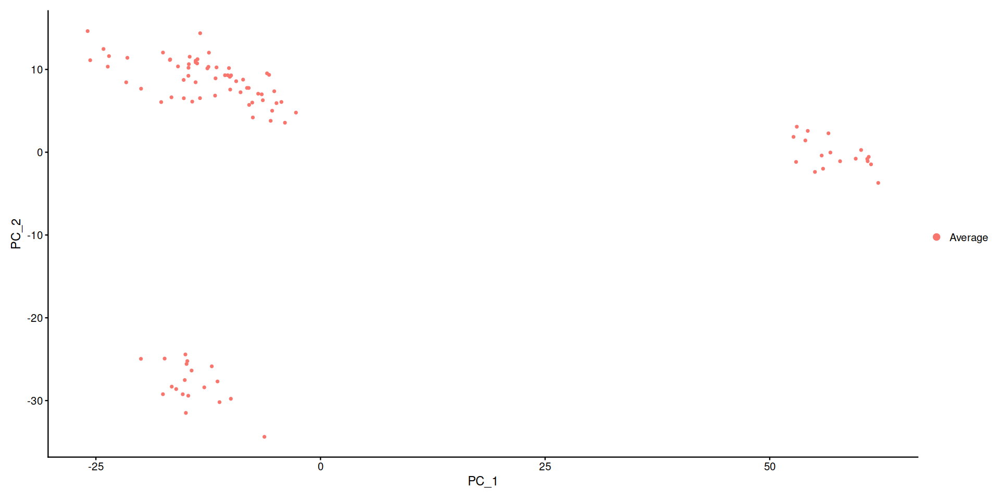

In [50]:
DimPlot(cd4_samples)

In [51]:
cd4_samples$Sample_char  <- colnames(cd4_samples)

In [52]:
cd4_samples$Sample_char  %>% table

.
    101 Dia T0 1 M Exp18     101 Dia T1 1 M Exp18     102 Dia T0 1 M Exp18 
                       1                        1                        1 
    102 Dia T1 1 M Exp18     103 Dia T0 2 M Exp18     103 Dia T1 2 M Exp18 
                       1                        1                        1 
    104 Dia T0 3 M Exp10     104 Dia T0 3 M Exp18     104 Dia T1 3 M Exp18 
                       1                        1                        1 
    105 Dia T0 1 M Exp10     105 Dia T0 1 M Exp18     105 Dia T1 1 M Exp18 
                       1                        1                        1 
    106 Dia T0 1 F Exp10     106 Dia T0 1 F Exp18     106 Dia T1 1 F Exp18 
                       1                        1                        1 
    107 Dia T0 1 M Exp11     107 Dia T0 1 M Exp18     107 Dia T1 1 M Exp18 
                       1                        1                        1 
    108 Dia T0 2 F Exp10     108 Dia T0 2 F Exp18     108 Dia T1 2 F Exp18 
          

In [53]:
cd4_samples@meta.data  <- cd4_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

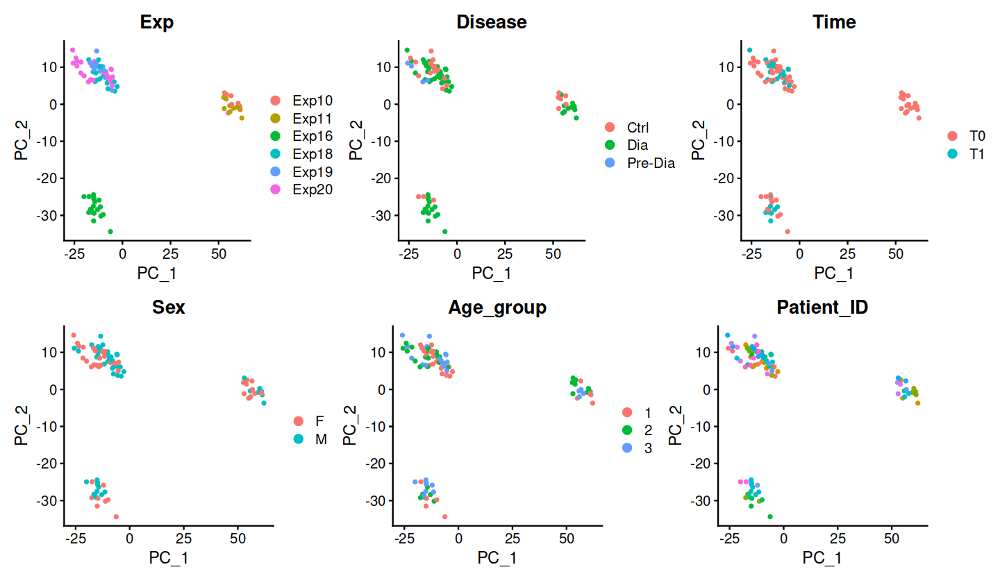

In [54]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))

## STACAS Integration over Experiment

In [55]:
merged.list  <- SplitObject(new_dia_cd4, split.by = "Experiment_ID")

In [56]:
plan("sequential")

In [57]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

library(STACAS)

new_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:12) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.8 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 4

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 4 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 4 3 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

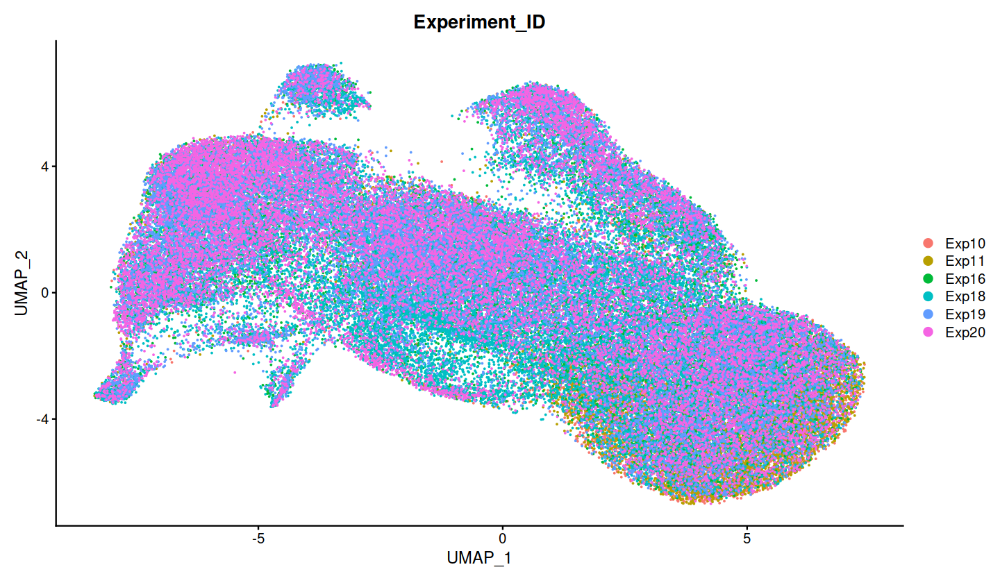

In [58]:
# Visualize

DimPlot(new_dia_experiment, group.by = c("Experiment_ID"))

In [59]:
saveRDS(new_dia_experiment, "data/processed/cd4_full_filt.rds")

# Add metadata

In [60]:
md_dia  <- read_xlsx("data/dia_metadata.xlsx")

In [61]:
md_dia

id_pat,patient,rc,dat_nar,matched_dataset_manual,matched_group_manual,matched_dataset_propensity,matched_group_propensity,time_taken,age_taken,...,neutr_abs,eoz_abs,baz_abs,lymph_perc,mon_perc,neutr_perc,eoz_perc,baz_perc,tdd_1,tdd_per_kg_1
<dbl>,<dbl>,<chr>,<dttm>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
101,101,1812230552,2018-12-23,NA,NA,NA,NA,T0,2.138261,...,0.88,0.10,0.04,0.700,0.090,0.170,0.020,0.008,17.8,1.4833333
102,102,1711110951,2017-11-11,NA,NA,NA,NA,T0,3.252567,...,3.03,0.06,0.05,0.440,0.089,0.450,0.009,0.008,21.5,1.2356322
103,103,1304191240,2013-04-19,yes,33,NA,NA,T0,7.816564,...,1.47,0.15,0.04,0.560,0.079,0.314,0.032,0.009,27.5,1.3414634
104,104,0408165087,2004-08-16,NA,NA,yes,33,T0,16.547570,...,3.60,0.24,0.03,0.290,0.089,0.574,0.038,0.005,24.5,0.5000000
105,105,1706101309,2017-06-10,NA,NA,NA,NA,T0,3.731691,...,2.76,0.36,0.06,0.500,0.072,0.360,0.047,0.008,15.0,0.7692308
106,106,1959271281,2019-09-27,NA,NA,NA,NA,T0,1.434634,...,1.45,0.21,0.03,0.667,0.100,0.199,0.029,0.004,10.5,1.0937500
107,107,1610250708,2016-10-25,NA,NA,NA,NA,T0,4.355921,...,1.60,0.13,0.03,0.700,0.052,0.221,0.018,0.004,16.0,0.9638554
108,108,1355270697,2013-05-27,yes,32,NA,NA,T0,7.786448,...,0.51,0.10,0.02,0.720,0.080,0.160,0.030,0.006,24.0,0.8888889
109,109,1506260129,2015-06-26,NA,NA,NA,NA,T0,5.705681,...,1.70,0.09,0.03,0.510,0.090,0.370,0.020,0.007,45.0,2.2500000


In [62]:
md_seurat  <- new_dia_experiment@meta.data

In [63]:
md_seurat$Patient_Time  <- paste(md_seurat$Patient_ID, md_seurat$Time)

In [64]:
md_joined  <- left_join(md_seurat, md_dia)

Joining with `by = join_by(Patient_Time)`


In [65]:
new_dia_experiment@meta.data  <- md_joined
rownames(new_dia_experiment@meta.data)  <- colnames(new_dia_experiment)

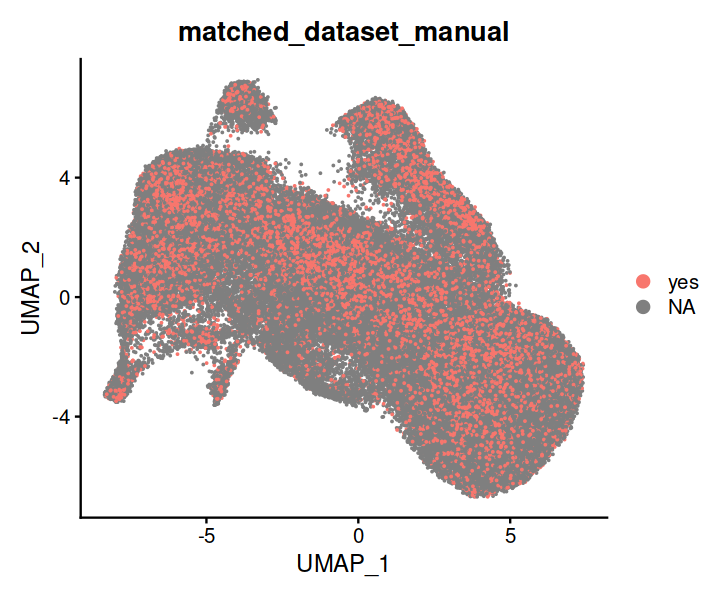

In [66]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_experiment, group.by = "matched_dataset_manual")

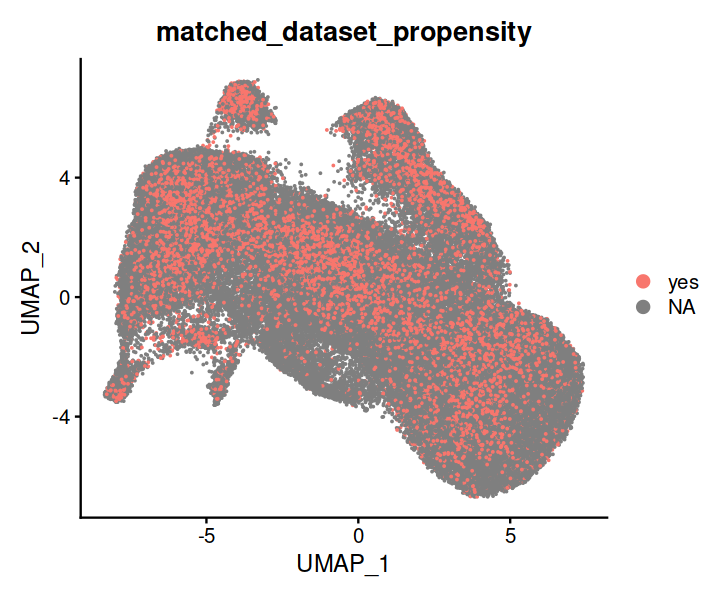

In [67]:
DimPlot(new_dia_experiment, group.by = "matched_dataset_propensity")

In [68]:
saveRDS(new_dia_experiment, "data/processed/cd4_full_filt.rds")

In [41]:
new_dia_cd4$Patient_Time  %>% table

.
101 T0 101 T1 102 T0 102 T1 103 T0 103 T1 104 T0 104 T1 105 T0 105 T1 106 T0 
  1275   1278   1267   1166   1265   1288   1788    948   2100   1107   2102 
106 T1 107 T0 107 T1 108 T0 108 T1 109 T0 109 T1 110 T0 110 T1 111 T0 111 T1 
  1075   2193   1383   2184   1017   1046    947   1897    989   1890    934 
112 T0 112 T1 113 T0 113 T1 114 T0 114 T1 115 T0 115 T1 116 T0 117 T0 117 T1 
   765    669   1766   1008   1552    687    730    764    977    809    740 
118 T0 118 T1 119 T0 119 T1 120 T0 120 T1 121 T0 121 T1 122 T0 122 T1 123 T0 
  1131    939    787    567    957    847   1523    964    960    928    722 
123 T1 124 T0 124 T1 125 T0 125 T1 126 T0 126 T1 127 T0 127 T1 128 T0 128 T1 
   771    758    786    917    616   1488    814   1393    643    810    689 
129 T0 129 T1 130 T0 130 T1 201 T0 201 T1 202 T0 202 T1 204 T0 204 T1 205 T0 
   786    768    613    628   1848   1027   1904   2203   1585    934    700 
206 T0 208 T0 209 T0 210 T0 211 T0 212 T0 213 T0 214 T0 215 T0

## Metadata patient table

Characterize metadata at T0

In [33]:
new_dia_cd4@meta.data  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
  [3] "nFeature_RNA"                "percent.mt"                 
  [5] "percent.rp"                  "nCount_Antibodies"          
  [7] "nFeature_Antibodies"         "hashtags"                   
  [9] "Experiment_ID"               "Prepared_by"                
 [11] "Sample_ID"                   "Well"                       
 [13] "Hashtag"                     "Hashtag_sequence"           
 [15] "Hashtag_cat_n"               "Hashtag_dilution"           
 [17] "Project.code"                "Well_CT_ID"                 
 [19] "Condition"                   "Disease"                    
 [21] "Time"                        "Species"                    
 [23] "Age"                         "Age_group"                  
 [25] "Sex"                         "Library_code"               
 [27] "Patient_ID"                  "is_cell"                    
 [29] "chain"                       "contig_id"                  
 [31] "high_confidence"             "productive"                 
 [33] "length"                      "reads"                      
 [35] "umis"                        "vdj_source"                 
 [37] "count_TRA"                   "count_TRB"                  
 [39] "count_Multi"                 "cdr3_A1"                    
 [41] "cdr3_A1_nt"                  "cdr3_A2"                    
 [43] "cdr3_A2_nt"                  "cdr3_B"                     
 [45] "cdr3_B_nt"                   "cdr3_Multi"                 
 [47] "cdr3_Multi_nt"               "v_gene_A1"                  
 [49] "j_gene_A1"                   "v_gene_A2"                  
 [51] "j_gene_A2"                   "v_gene_B"                   
 [53] "d_gene_B"                    "j_gene_B"                   
 [55] "v_gene_Multi"                "d_gene_Multi"               
 [57] "j_gene_Multi"                "clonotypes"                 
 [59] "has.VDJ"                     "has.complete.VDJ"           
 [61] "nCount_PTPRC"                "nFeature_PTPRC"             
 [63] "RNA_snn_res.0.5"             "seurat_clusters"            
 [65] "clonotype.repeated"          "RNA_snn_res.1"              
 [67] "barcode"                     "Monaco_single"              
 [69] "HPCA_single"                 "Wherry_main"                
 [71] "nCount_refAssay"             "nFeature_refAssay"          
 [73] "predicted.celltype.l1.score" "predicted.celltype.l1"      
 [75] "predicted.celltype.l2.score" "predicted.celltype.l2"      
 [77] "predicted.celltype.l3.score" "predicted.celltype.l3"      
 [79] "mapping.score"               "Sample_char"                
 [81] "Patient_Time"                "id_pat"                     
 [83] "patient"                     "rc"                         
 [85] "dat_nar"                     "matched_dataset_manual"     
 [87] "matched_group_manual"        "matched_dataset_propensity" 
 [89] "matched_group_propensity"    "time_taken"                 
 [91] "age_taken"                   "age_group"                  
 [93] "sex"                         "dat_man"                    
 [95] "age_man"                     "hba1c_man"                  
 [97] "ph_man"                      "ahco3_man"                  
 [99] "random_cpeptide_man"         "bh_man"                     
[101] "bh_man_sds"                  "bw_man"                     
[103] "bw_man_sds"                  "bmi_man"                    
[105] "bmi_man_sds"                 "gad_man"                    
[107] "iaa_man"                     "ia2_man"                    
[109] "znt8_man"                    "date_taken_1"               
[111] "fasting_cpept_1"             "wbc"                        
[113] "lymph_abs"                   "mon_abs"                    
[115] "neutr_abs"                   "eoz_abs"                    
[117] "baz_abs"                     "lymph_perc"                 
[119] "mon_perc"                    "neutr_perc"                 
[121] "eoz_perc"                    "baz_p

In [34]:
md2  <- new_dia_cd4@meta.data

In [39]:
write.csv(md2, "metadata_from_seurat.csv")

In [ ]:
md2  <- md2  %>% filter(Time == "T0")

# Analysis CD4 Level 1

In [69]:
new_dia_cd4  <- new_dia_experiment

In [2]:
new_dia_cd4  <- readRDS("data/processed/cd4_full_filt.rds")

In [70]:
DefaultAssay(new_dia_cd4)  <- "integrated"

In [71]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [72]:
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 87897
Number of edges: 2281405

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8494
Number of communities: 13
Elapsed time: 32 seconds


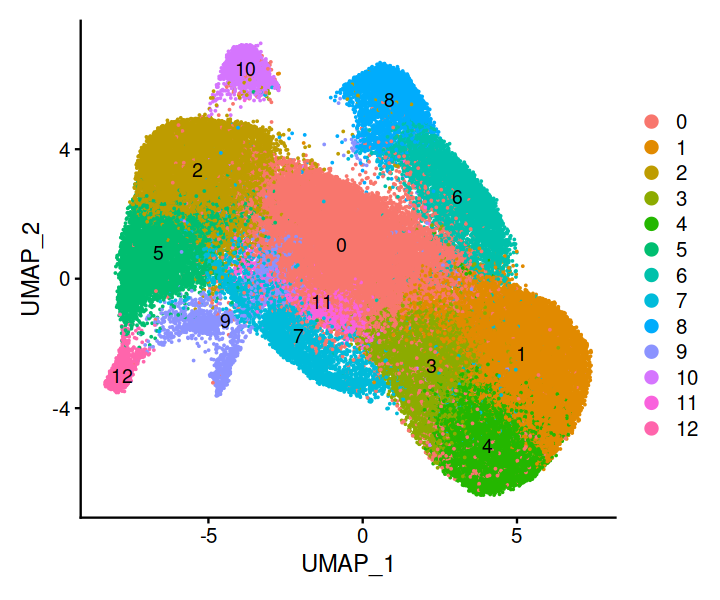

In [73]:
DimPlot(new_dia_cd4, label = T)

In [74]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% 
mutate(annotations_l1 = recode_factor(seurat_clusters, 
                                      "0" = "CD4 T cells",
                                     "1" = "CD4 T cells",
                                     "2" = "CD4 T cells",
                                     "3" = "CD4 T cells",
                                     "4" = "CD4 T cells",
                                     "5" = "CD4 T cells",
                                     "6" = "CD4 T cells",
                                     "7" = "CD4 T cells",
                                     "8" = "CD4 T cells",
                                     "9" = "CD4 T cells",
                                     "10" = "Unconventional T cells",
                                     "11" = "CD4 T cells",
                                     "12" = "CD4 T cells"))

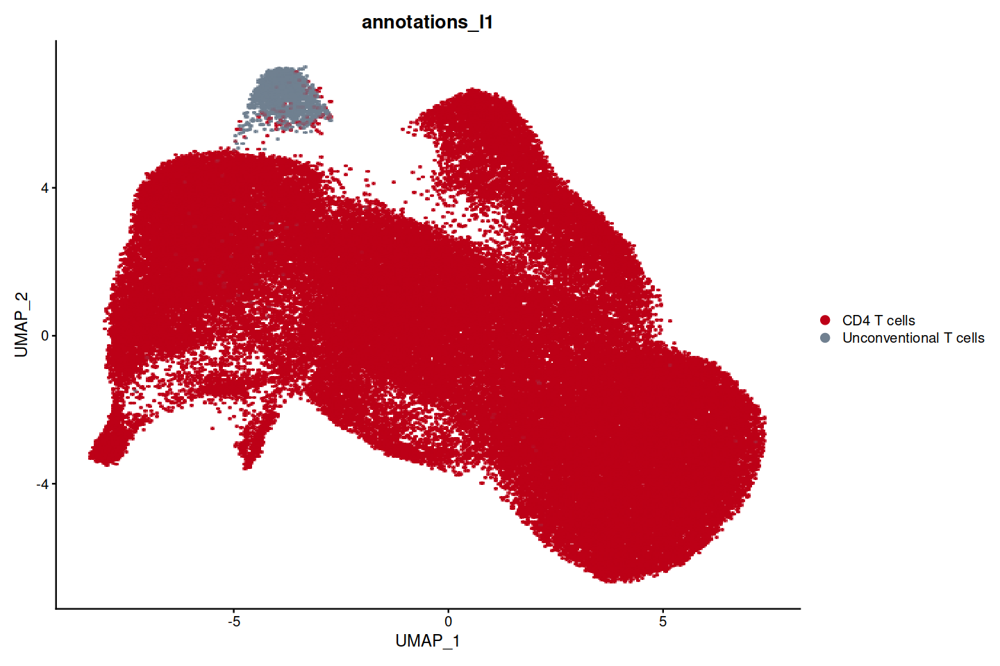

In [75]:
options(repr.plot.width = 12, repr.plot.height = 8)

DimPlot(new_dia_cd4, group.by = "annotations_l1", raster = T, pt.size = 2, 
       cols = c("#BD0017", "slategray"))

In [76]:
saveRDS(new_dia_cd4, "data/processed/cd4_full_filt.rds")

# Analysis CD4 Level 2

In [ ]:
new_dia_cd4  <- readRDS("data/processed/cd4_full_filt.rds")

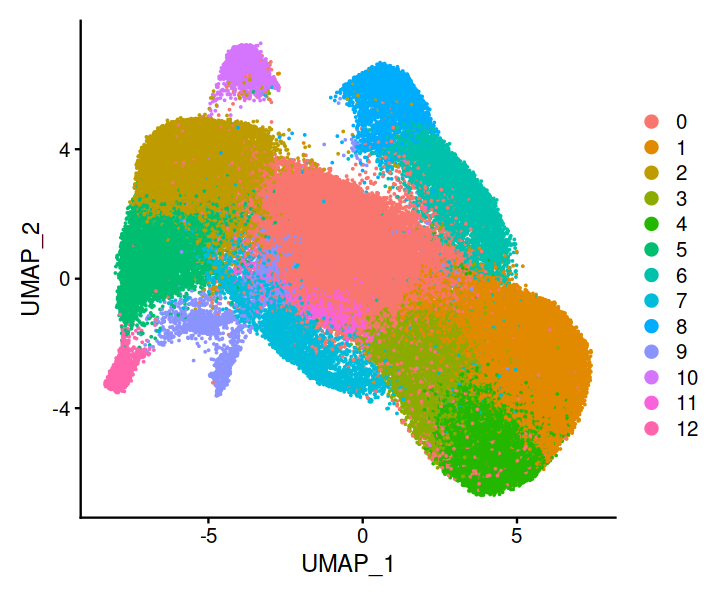

In [5]:
DimPlot(new_dia_cd4)

In [6]:
merged.list  <- SplitObject(subset(new_dia_cd4, annotations_l1 == "CD4 T cells"), split.by = "Experiment_ID")

In [7]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

In [8]:
new_dia_experiment <- Run.STACAS(merged.list, dims = 1:15)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:15)

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.4 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 3 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 5 3 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

In [9]:
cd4_subcluster <- FindNeighbors(new_dia_experiment, reduction = "pca", dims = 1:15)

Computing nearest neighbor graph

Computing SNN



In [29]:
DefaultAssay(cd4_subcluster)  <- "integrated"

In [30]:
cd4_subcluster <- FindClusters(cd4_subcluster, resolution = 0.7)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 86174
Number of edges: 2163478

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8344
Number of communities: 15
Elapsed time: 31 seconds


Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_lapply-1') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore"."


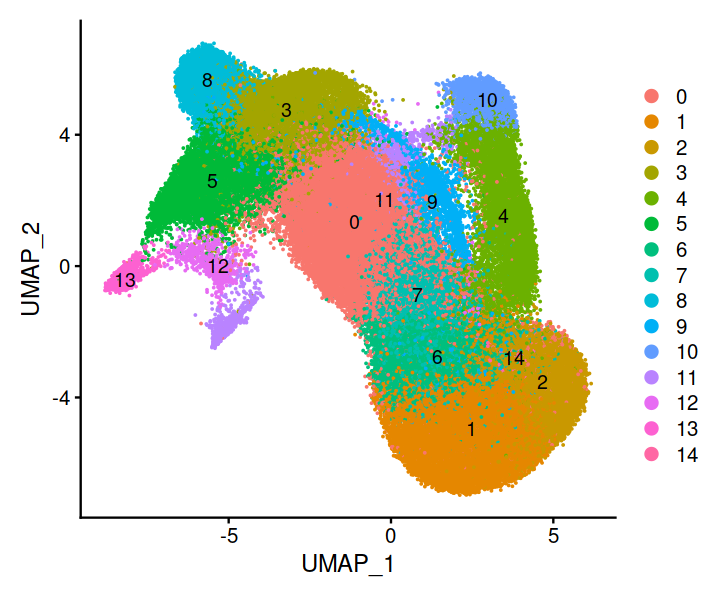

In [31]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, label = T)

In [12]:
DefaultAssay(cd4_subcluster)  <- "RNA"

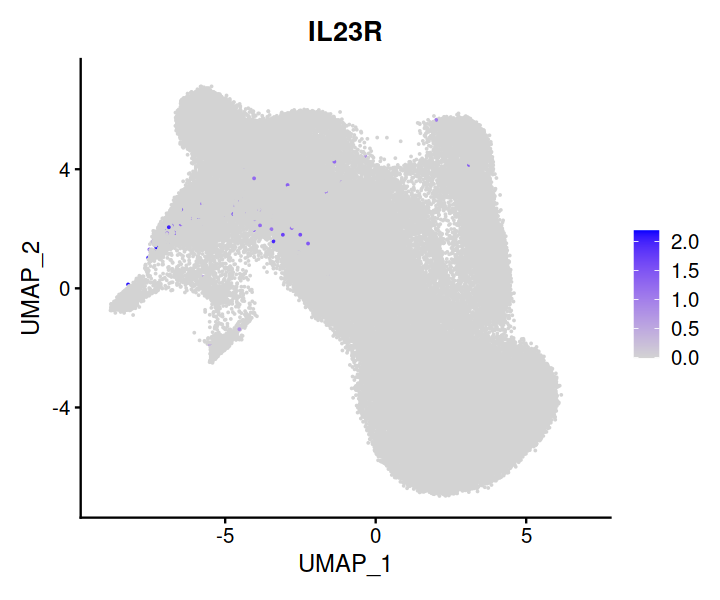

In [13]:
FeaturePlot(cd4_subcluster, features = "IL23R")

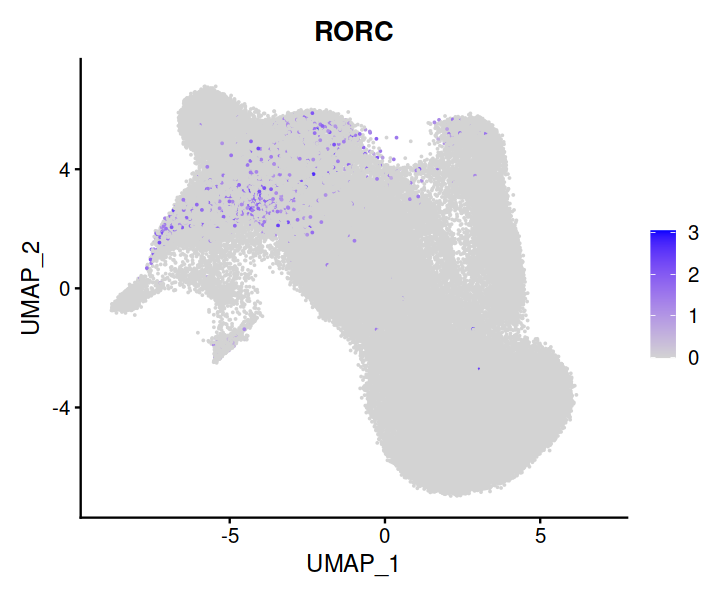

In [14]:
FeaturePlot(cd4_subcluster, features = "RORC")

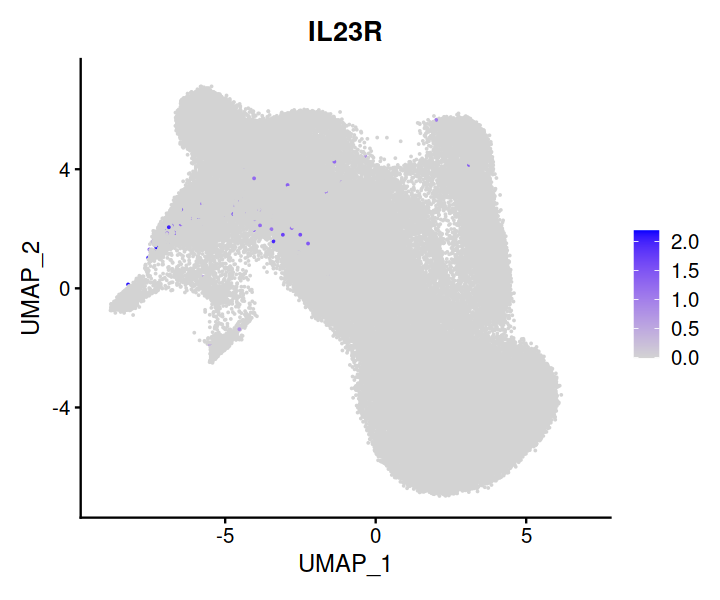

In [15]:
FeaturePlot(cd4_subcluster, features = "IL23R")

In [ ]:
cd4_subcluster

In [88]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, cells.highlight = colnames(c5))

ERROR: Error in colnames(c5): object 'c5' not found


In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5)

seurat_meta_data <- cd4_subcluster@meta.data

# Create grouped dataframe, calculate the frequencies of clusters
df4 <- seurat_meta_data %>% 
  group_by(Sample_ID, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>% 
dplyr::select(-n)  %>% 
ungroup   %>% 
pivot_wider(names_from = "seurat_clusters", values_from = "freq", values_fill = 0)   %>% 
pivot_longer(!Sample_ID, values_to = "freq", names_to = "seurat_clusters")
# Control - all sums should be one
# df4 %>% group_by(Sample_ID) %>% summarise(sum = sum(freq))

# As we've lost non-grouping variables, let's join them back
md_to_join <- seurat_meta_data %>% 
  dplyr::select(Sample_ID, Condition, Disease, Sex, Age, Age_group, Patient_ID, Time, Experiment_ID) %>% 
  unique()

df4  <- left_join(df4, md_to_join)

# The final plot

df4 %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.7, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.1, height = 0), 
  size = 3, shape = 21, stackdir='center', aes(fill = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 6) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
options(repr.plot.width = 26, repr.plot.height = 12)

df4 %>% 
filter(Condition %in% c("Ctrl T0", "Dia T0") & Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = Condition, shape = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 11) +
scale_shape_manual(values = c(21,22))+
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 20)
df4 %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = seurat_clusters)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos), color = "black", shape = 21) + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 5) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ylim(0,NA) +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

In [4]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, label = T)

ERROR: Error in is(x, "classRepresentation"): object 'cd4_subcluster' not found


In [16]:
cd4_subcluster@meta.data  <- cd4_subcluster@meta.data  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, "0" = "Tfh",
                                     "1" = "Naive",
                                     "2" = "Th1",
                                     "3" = "Naive",
                                     "4" = "Tcm",
                                     "5" = "Naive",
                                     "6" = "Th1/Th17",
                                     "7" = "Treg naive",
                                     "8" = "ISAGhi",
                                     "9" = "Treg memory",
                                     "10" = "Tfh",
                                     "11" = "Proliferating",
                                     "12" = "Th2",
                                     "13" = "Temra"))

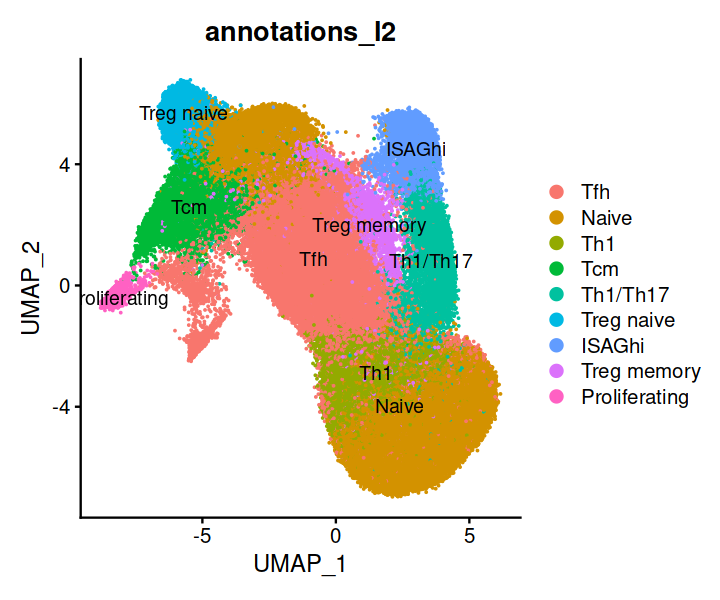

In [17]:
DimPlot(cd4_subcluster, label = T, group.by = "annotations_l2")

In [18]:
plan("multisession")

In [19]:
mrk  <- FindAllMarkers(cd4_subcluster, logfc.threshold = log(1.5))

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11



In [20]:
write.csv(mrk, "markers_cd4_full.csv")

In [21]:
saveRDS(cd4_subcluster, "data/processed/cd4_subcluster.rds")

In [22]:
Idents(cd4_subcluster)  <- cd4_subcluster$annotations_l2

In [23]:
mrk  <- FindAllMarkers(cd4_subcluster, logfc.threshold = log(1.5))

Calculating cluster Tfh

Calculating cluster Naive

Calculating cluster Th1

Calculating cluster Tcm

Calculating cluster Th1/Th17

Calculating cluster Treg naive

Calculating cluster ISAGhi

Calculating cluster Treg memory

Calculating cluster Proliferating



In [24]:
write.csv(mrk, "markers_cd4_full_annot_l2.csv")

In [26]:
Idents(cd4_subcluster)  <- cd4_subcluster$Disease

mrk  <- FindAllMarkers(subset(cd4_subcluster, Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & 
                              Time == "T0" &
                              Disease %in% c("Dia", "Ctrl")))

write.csv(mrk, "markers_cd4_dia_vs_hd_t0.csv")

Calculating cluster Dia

Calculating cluster Ctrl



### Cluster tree

In [ ]:
DimPlot(cd4_subcluster, label = T)

In [ ]:
cd4_subcluster <- BuildClusterTree(
  cd4_subcluster,
  dims = 1:12,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [ ]:
tree <- cd4_subcluster@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [ ]:
install.packages("ggtree")

In [ ]:
library(ggtree)

In [ ]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(color = (scales::hue_pal() (14)), shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

In [ ]:
options(repr.plot.width=3.5, repr.plot.height=3)
p

In [ ]:
DimPlot(cd4_subcluster)

In [ ]:
FeaturePlot(cd4_subcluster, features = "GZMK", min.cutoff = 0)

In [ ]:
c5  <- readRDS("data/processed/c5.rds")

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, cells.highlight = colnames(c5))

## Analysis Level 3: Treg

In [ ]:
treg <- subset(cd4_subcluster, seurat_clusters %in% c(6,8))

In [ ]:
treg_dia_experiment  <- SplitObject(treg, split.by = "Experiment_ID")

In [ ]:
treg_dia_experiment

In [ ]:
plan("sequential")

In [ ]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = treg_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

library(STACAS)

treg_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
treg_dia_experiment <- RunUMAP(treg_dia_experiment, dims = 1:12) 

In [ ]:
# Visualize
options(repr.plot.width = 10, repr.plot.height = 5)

DimPlot(treg_dia_experiment, group.by = c("Monaco_single"))

In [ ]:
treg_dia_experiment  <- FindNeighbors(treg_dia_experiment)
treg_dia_experiment  <- FindClusters(treg_dia_experiment, resolution = 0.5)

### Treg subset annotations

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(treg_dia_experiment, label = T)

In [ ]:
FeaturePlot(treg_dia_experiment, features = "FOXP3", min.cutoff = 0)

In [ ]:
FeaturePlot(treg_dia_experiment, features = "GZMK", min.cutoff = 0)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5)

seurat_meta_data <- treg_dia_experiment@meta.data

# Create grouped dataframe, calculate the frequencies of clusters
df4 <- seurat_meta_data %>% 
  group_by(Sample_ID, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>% 
dplyr::select(-n)  %>% 
ungroup   %>% 
pivot_wider(names_from = "seurat_clusters", values_from = "freq", values_fill = 0)   %>% 
pivot_longer(!Sample_ID, values_to = "freq", names_to = "seurat_clusters")
# Control - all sums should be one
# df4 %>% group_by(Sample_ID) %>% summarise(sum = sum(freq))

# As we've lost non-grouping variables, let's join them back
md_to_join <- seurat_meta_data %>% 
  dplyr::select(Sample_ID, Condition, Disease, Sex, Age, Age_group, Patient_ID, Time, Experiment_ID) %>% 
  unique()

df4  <- left_join(df4, md_to_join)

# The final plot

df4 %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.7, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.1, height = 0), 
  size = 3, shape = 21, stackdir='center', aes(fill = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 6) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
options(repr.plot.width = 26, repr.plot.height = 12)

df4 %>% 
filter(Condition %in% c("Ctrl T0", "Dia T0") & Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = Condition, shape = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 11) +
scale_shape_manual(values = c(21,22))+
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
df4$annotations_l2  <- df4$seurat_clusters

In [ ]:
options(repr.plot.width = 25, repr.plot.height = 8)

df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

In [ ]:
df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & Time == "T0")  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

## Analysis Level 3: Teffector

In [ ]:
teff <- subset(cd4_subcluster, seurat_clusters %in% c(0,4,10))

In [ ]:
teff

In [ ]:
teff_dia_experiment  <- SplitObject(teff, split.by = "Experiment_ID")

In [ ]:
teff_dia_experiment

In [ ]:
plan("sequential")

In [ ]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = teff_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 500)
})

library(STACAS)

teff_dia_experiment <- Run.STACAS(merged.list, dims = 1:10)
teff_dia_experiment <- RunUMAP(teff_dia_experiment, dims = 1:10) 

In [ ]:
# Visualize

DimPlot(teff_dia_experiment)

In [ ]:
teff_dia_experiment  <- FindNeighbors(teff_dia_experiment)
teff_dia_experiment  <- FindClusters(teff_dia_experiment, resolution = 0.5)

In [ ]:
DimPlot(teff_dia_experiment, label = T)